# The Sonic Fingerprint: A Computational Analysis and Classification of Hans Zimmer and Ludwig Göransson's Musical Styles

## Introduction
In the landscape of modern film scoring, **Hans Zimmer** and **Lüdwig Göransson** stand as two of the most influential and recognizable composers. While both have crafted iconic and innovative soundscapes, their stylistic approaches are distinct. This project employs computational audio analysis and machine learning to move beyond subjective listening and quantitatively identify the unique characteristics that define their respective "sonic fingerprints."

By converting audio signals into a rich set of numerical features—representing timbre, harmony, rhythm, and texture—this analysis seeks to answer a central question: Can a machine learning model be trained to distinguish between the works of these two composers with high accuracy? Furthermore, by interpreting the model's results, we aim to pinpoint the specific musical elements that are the most powerful differentiators in their compositional styles.

![Hans Zimmer vs Lüdwig](https://i.ytimg.com/vi/PkA2Wh-hdh8/hq720.jpg?sqp=-oaymwEhCK4FEIIDSFryq4qpAxMIARUAAAAAGAElAADIQj0AgKJD&rs=AOn4CLAhTq0zawMlHYTxGd5Z66vGZ6nVRw)

## Step 1: Data Curation and Setup

The initial step involved importing essential Python libraries (os, pandas) and defining the file paths to the dataset hosted on Kaggle. The code systematically iterated through the directories for each composer, extracting every .mp3 file. For each file, it parsed the filename to separate the track title and album, then compiled this information—along with the full filepath and the composer's name—into a list. This list was subsequently converted into a structured and organized pandas DataFrame.

In [1]:
# 1. Import Necessary Libraries
# We'll need 'os' to navigate the file system and 'pandas' to create our DataFrame.
import os
import pandas as pd
import numpy as np

# A fun library to let us listen to audio directly in the notebook
from IPython.display import Audio

print("Libraries imported successfully!")

Libraries imported successfully!


In [2]:
# 2. Define the file paths for the composers' music
# These are the paths you provided from your Kaggle dataset.
base_path = "/kaggle/input/music-scores-of-hans-zimmer-and-ldwig-gransson/Music scores"
zimmer_path = os.path.join(base_path, "Hans_zimmer")
goransson_path = os.path.join(base_path, "Lüdwig_göransson")

# Let's quickly verify these paths exist
print(f"Hans Zimmer path exists: {os.path.exists(zimmer_path)}")
print(f"Lüdwig Göransson path exists: {os.path.exists(goransson_path)}")

Hans Zimmer path exists: True
Lüdwig Göransson path exists: True


In [3]:
# 3. Create a list of all audio files and their metadata
metadata_list = []

# Process Hans Zimmer's files
for filename in os.listdir(zimmer_path):
    if filename.endswith('.mp3'):
        # Construct the full path to the file
        file_path = os.path.join(zimmer_path, filename)
        
        # Parse title and album from the filename (e.g., "Time_Inception.mp3")
        try:
            title, album = filename.replace('.mp3', '').split('_', 1)
        except ValueError:
            # If there's no underscore, use the whole name as the title
            title = filename.replace('.mp3', '')
            album = 'Unknown'
            
        metadata_list.append({
            'filepath': file_path,
            'composer': 'Hans Zimmer',
            'title': title,
            'album': album
        })

# Process Ludwig Göransson's files
for filename in os.listdir(goransson_path):
    if filename.endswith('.mp3'):
        file_path = os.path.join(goransson_path, filename)
        try:
            title, album = filename.replace('.mp3', '').split('_', 1)
        except ValueError:
            title = filename.replace('.mp3', '')
            album = 'Unknown'
            
        metadata_list.append({
            'filepath': file_path,
            'composer': 'Lüdwig Göransson',
            'title': title,
            'album': album
        })

print(f"Found {len(metadata_list)} total audio files.")

Found 50 total audio files.


In [4]:
# 4. Create a Pandas DataFrame from our list
metadata_df = pd.DataFrame(metadata_list)

# 5. Verify and Explore the DataFrame
print("DataFrame created successfully. Here's a preview:")
display(metadata_df.head()) # Show the first 5 rows

print("\nBasic information about the DataFrame:")
metadata_df.info()

print("\nNumber of tracks per composer:")
print(metadata_df['composer'].value_counts())

DataFrame created successfully. Here's a preview:


,filepath,composer,title,album
0,/kaggle/input/music-scores-of-hans-zimmer-and-...,Hans Zimmer,Run For The Podium,F1
1,/kaggle/input/music-scores-of-hans-zimmer-and-...,Hans Zimmer,Flight,Man of Steel
2,/kaggle/input/music-scores-of-hans-zimmer-and-...,Hans Zimmer,Supermarine,Dunkirk
3,/kaggle/input/music-scores-of-hans-zimmer-and-...,Hans Zimmer,Three Laps Is A Lifetime,F1
4,/kaggle/input/music-scores-of-hans-zimmer-and-...,Hans Zimmer,Anything You Wish Youd Done Differently,F1



Basic information about the DataFrame:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50 entries, 0 to 49
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   filepath  50 non-null     object
 1   composer  50 non-null     object
 2   title     50 non-null     object
 3   album     50 non-null     object
dtypes: object(4)
memory usage: 1.7+ KB

Number of tracks per composer:
composer
Hans Zimmer         25
Lüdwig Göransson    25
Name: count, dtype: int64


### Output Meaning
The result of this step was a clean metadata_df DataFrame. This table acted as the project's master manifest, with each row representing a single musical track and columns detailing its composer, title, album, and location on disk. This organized structure was crucial for the automated processing and analysis that followed.



In [5]:
# 6. (Optional but Recommended) Let's test one audio file to make sure it's accessible
print("\nPlaying a sample track from Hans Zimmer...")
sample_track_path = metadata_df[metadata_df['composer'] == 'Hans Zimmer'].iloc[0]['filepath']
display(Audio(sample_track_path))


Playing a sample track from Hans Zimmer...


## Audio Feature Extraction

This phase focused on translating raw audio into a format suitable for machine learning. A custom function, extract_features, was defined using the librosa library. For each audio file (loading the first 60 seconds for consistency), this function extracted a vector of 34 key features, including:

* 13 MFCCs (representing timbre and sound quality)

* 7 Spectral Contrast Features (representing sonic texture)

* Tempo (BPM) and Zero-Crossing Rate (percussiveness)

  
This function was then applied to every track in the metadata_df, and the resulting feature vectors were organized into a new, comprehensive final_df DataFrame.

In [6]:
# 1. Import Librosa and a progress bar tool
import librosa
from tqdm.notebook import tqdm

print("Librosa imported successfully.")

Librosa imported successfully.


In [7]:
# 2. Define our feature extraction function
def extract_features(file_path):
    """Extracts a set of features from an audio file."""
    try:
        # Load the audio file, using the first 60 seconds to ensure consistency
        y, sr = librosa.load(file_path, duration=60)
        
        # --- Extract Features ---
        # Timbre: Mel-Frequency Cepstral Coefficients (MFCCs)
        mfccs = np.mean(librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13).T, axis=0)
        
        # Harmony: Chroma Features
        chroma = np.mean(librosa.feature.chroma_stft(y=y, sr=sr).T, axis=0)
        
        # Texture: Spectral Contrast
        spectral_contrast = np.mean(librosa.feature.spectral_contrast(y=y, sr=sr).T, axis=0)
        
        # Rhythm: Tempo
        tempo, _ = librosa.beat.beat_track(y=y, sr=sr)
        
        # Percussiveness: Zero-Crossing Rate
        zcr = np.mean(librosa.feature.zero_crossing_rate(y).T, axis=0)
        
        # Combine all features into a single array
        # Note: tempo is a single value, so we wrap it in a list to concatenate
        features = np.hstack([mfccs, chroma, spectral_contrast, tempo, zcr])
        return features
        
    except Exception as e:
        # If a file is corrupted or causes an error, we'll know
        print(f"Error processing {file_path}: {e}")
        return None

In [8]:
# 3. Apply the function to all files in our DataFrame
# We'll use tqdm to show a progress bar because this can take a while!
tqdm.pandas(desc="Extracting Features")

# The .progress_apply() function will call our 'extract_features' function on each 'filepath'
metadata_df['features'] = metadata_df['filepath'].progress_apply(extract_features)

print("\nFeature extraction complete.")

Extracting Features:   0%|          | 0/50 [00:00<?, ?it/s]

[src/libmpg123/id3.c:process_comment():587] error: No comment text / valid description?
[src/libmpg123/id3.c:process_comment():587] error: No comment text / valid description?
[src/libmpg123/id3.c:process_comment():587] error: No comment text / valid description?
[src/libmpg123/id3.c:process_comment():587] error: No comment text / valid description?
[src/libmpg123/id3.c:process_comment():587] error: No comment text / valid description?
[src/libmpg123/id3.c:process_comment():587] error: No comment text / valid description?
[src/libmpg123/id3.c:process_comment():587] error: No comment text / valid description?
[src/libmpg123/id3.c:process_comment():587] error: No comment text / valid description?
[src/libmpg123/id3.c:process_comment():587] error: No comment text / valid description?
[src/libmpg123/id3.c:process_comment():587] error: No comment text / valid description?
[src/libmpg123/id3.c:process_comment():587] error: No comment text / valid description?
[src/libmpg123/id3.c:process_com


Feature extraction complete.


In [9]:
# 4. Create the Final Features DataFrame
# First, let's remove any rows where feature extraction might have failed
features_df = metadata_df.dropna(subset=['features'])

# Convert the 'features' column (which contains NumPy arrays) into separate columns
feature_data = pd.DataFrame(features_df['features'].to_list())

# Generate column names for our new features
num_mfccs = 13
num_chroma = 12
num_spectral_contrast = 7
feature_columns = (
    [f'mfcc_{i}' for i in range(num_mfccs)] +
    [f'chroma_{i}' for i in range(num_chroma)] +
    [f'spec_contrast_{i}' for i in range(num_spectral_contrast)] +
    ['tempo', 'zcr']
)
feature_data.columns = feature_columns

# Combine our original metadata with the new feature data
final_df = pd.concat([features_df.reset_index(drop=True), feature_data], axis=1)

# We don't need the original 'features' column anymore
final_df = final_df.drop(columns=['features'])

# 5. Verify the final DataFrame
print("\nHere is a preview of your final DataFrame with all features:")
display(final_df.head())

# Check the shape to see how many tracks and features we have
print(f"\nDataFrame shape: {final_df.shape}")


Here is a preview of your final DataFrame with all features:


,filepath,composer,title,album,mfcc_0,mfcc_1,mfcc_2,mfcc_3,mfcc_4,mfcc_5,...,chroma_11,spec_contrast_0,spec_contrast_1,spec_contrast_2,spec_contrast_3,spec_contrast_4,spec_contrast_5,spec_contrast_6,tempo,zcr
0,/kaggle/input/music-scores-of-hans-zimmer-and-...,Hans Zimmer,Run For The Podium,F1,-253.620071,152.662140,8.475886,35.758362,19.100275,15.406120,...,0.357078,20.719368,15.277131,16.545134,16.472447,17.613497,18.681639,45.899467,112.347147,0.023237
1,/kaggle/input/music-scores-of-hans-zimmer-and-...,Hans Zimmer,Flight,Man of Steel,-451.778107,152.274460,39.602203,27.693298,24.948719,11.770524,...,0.318133,21.212913,16.549405,19.212721,17.917964,17.388247,23.019534,40.318254,129.199219,0.018898
2,/kaggle/input/music-scores-of-hans-zimmer-and-...,Hans Zimmer,Supermarine,Dunkirk,-223.879257,108.342079,9.275426,19.536898,14.109044,7.339960,...,0.368979,21.275605,13.201614,14.815483,15.348772,15.527344,15.400675,45.205143,117.453835,0.063077
3,/kaggle/input/music-scores-of-hans-zimmer-and-...,Hans Zimmer,Three Laps Is A Lifetime,F1,-307.870605,168.523987,14.329771,39.161499,24.730356,15.073124,...,0.598999,18.745995,14.472763,16.650769,17.612403,17.120744,21.175060,47.180132,161.499023,0.018501
4,/kaggle/input/music-scores-of-hans-zimmer-and-...,Hans Zimmer,Anything You Wish Youd Done Differently,F1,-377.811096,135.263916,14.948485,19.578894,12.595380,-3.200207,...,0.176683,24.751785,20.246346,23.409560,23.230092,22.492414,22.254804,47.257700,95.703125,0.034217



DataFrame shape: (50, 38)


### Output Meaning
The output was a single, powerful DataFrame where each row still represented a track, but now included 34 new columns (In total 38) corresponding to its unique musical features. The audio was effectively converted into a numerical "fingerprint," making it possible to compare tracks mathematically and visually.

## Exploratory Data Analysis (EDA)

This was the most extensive phase, designed to visually uncover patterns in the data through a series of increasingly specific visualizations.

**Initial Visualizations**

Code Explanation: Standard visualization libraries (matplotlib, seaborn) were used to create initial comparative plots. This included a box plot for tempo, a bar chart for the average **harmonic signature (chroma), and a t-SNE plot to visualize the high-dimensional feature space in 2D**.

In [10]:
# 1. Import Visualization Libraries
import matplotlib.pyplot as plt
import seaborn as sns

# Set a nice style for our plots
sns.set_style("whitegrid")
plt.rcParams['figure.figsize'] = (12, 6)

print("Visualization libraries ready.")

Visualization libraries ready.


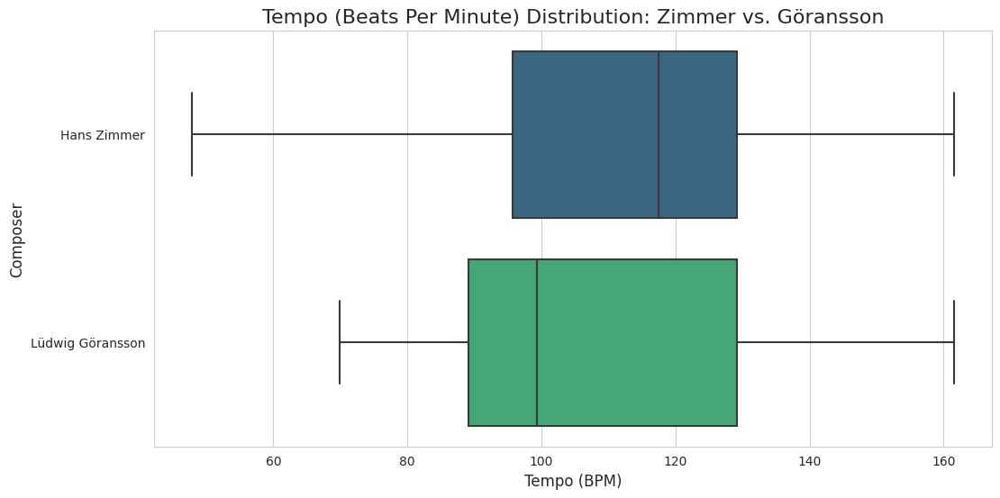

In [11]:
# 2. Visualize Tempo Distribution
sns.boxplot(data=final_df, x='tempo', y='composer', palette='viridis')
plt.title('Tempo (Beats Per Minute) Distribution: Zimmer vs. Göransson', fontsize=16)
plt.xlabel('Tempo (BPM)', fontsize=12)
plt.ylabel('Composer', fontsize=12)
plt.savefig('Tempo Distribution')
plt.show()

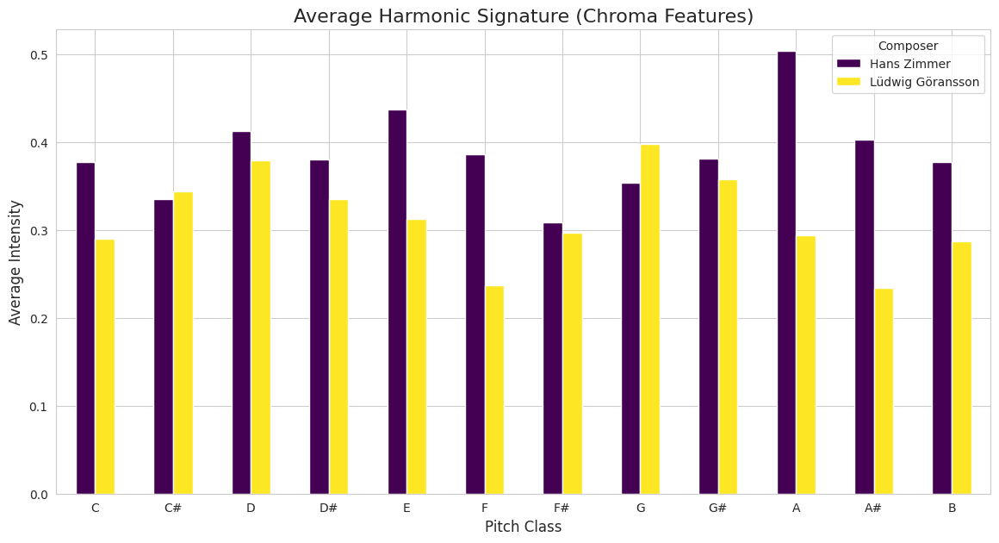

In [12]:
# 3. Visualize Average Harmonic Content (Chroma)
# Separate the data by composer
zimmer_df = final_df[final_df['composer'] == 'Hans Zimmer']
goransson_df = final_df[final_df['composer'] == 'Lüdwig Göransson']

# Get the chroma columns
chroma_cols = [f'chroma_{i}' for i in range(12)]
pitch_classes = ['C', 'C#', 'D', 'D#', 'E', 'F', 'F#', 'G', 'G#', 'A', 'A#', 'B']

# Calculate the mean chroma values for each composer
zimmer_chroma_mean = zimmer_df[chroma_cols].mean()
goransson_chroma_mean = goransson_df[chroma_cols].mean()

# Create a DataFrame for plotting
chroma_plot_df = pd.DataFrame({
    'Hans Zimmer': zimmer_chroma_mean.values,
    'Lüdwig Göransson': goransson_chroma_mean.values
}, index=pitch_classes)

# Plot the results
chroma_plot_df.plot(kind='bar', figsize=(14, 7), colormap='viridis')
plt.title('Average Harmonic Signature (Chroma Features)', fontsize=16)
plt.xlabel('Pitch Class', fontsize=12)
plt.ylabel('Average Intensity', fontsize=12)
plt.xticks(rotation=0)
plt.legend(title='Composer')
plt.savefig('Average Harmonic Signature')
plt.show()

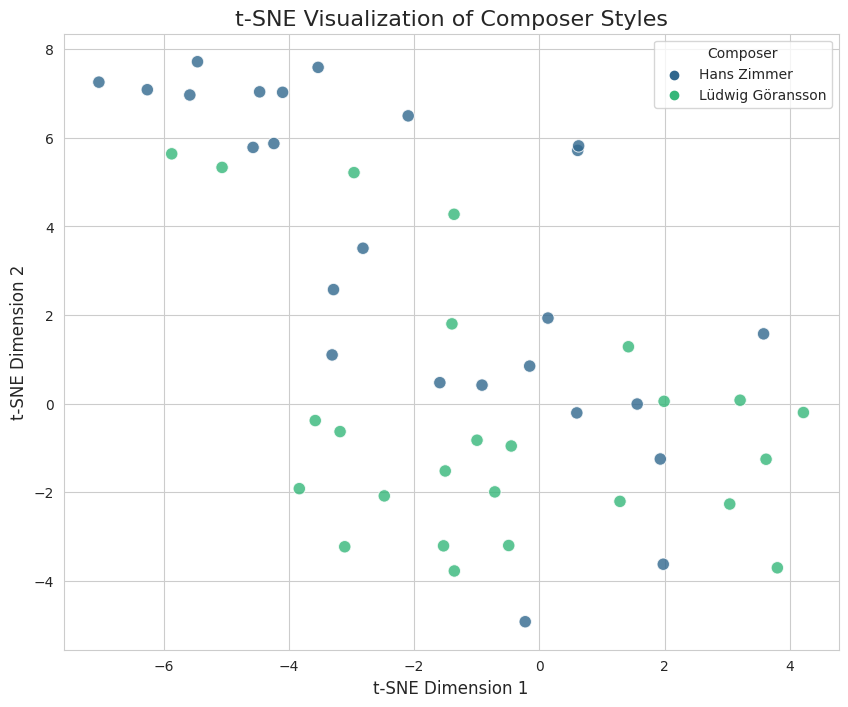

In [13]:
# 4. Visualize Overall Style with t-SNE
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE

# Prepare the data: features (X) and labels (y)
feature_cols = final_df.columns[4:] # Select all feature columns
X = final_df[feature_cols]
y = final_df['composer']

# IMPORTANT: Scale the features before using t-SNE
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Apply t-SNE
tsne = TSNE(n_components=2, perplexity=15, random_state=42, n_iter=1000)
X_tsne = tsne.fit_transform(X_scaled)

# Create a DataFrame for the t-SNE results
tsne_df = pd.DataFrame(data=X_tsne, columns=['tsne_1', 'tsne_2'])
tsne_df['composer'] = y.values

# Plot the t-SNE results
plt.figure(figsize=(10, 8))
sns.scatterplot(
    x='tsne_1', y='tsne_2',
    hue='composer',
    palette='viridis',
    data=tsne_df,
    s=80, # size of points
    alpha=0.8 # transparency
)

plt.title('t-SNE Visualization of Composer Styles', fontsize=16)
plt.xlabel('t-SNE Dimension 1', fontsize=12)
plt.ylabel('t-SNE Dimension 2', fontsize=12)
plt.legend(title='Composer')
plt.savefig('t-SNE Visualization of Composer Styles')
plt.show()

### Output Meaning

These first plots revealed clear tendencies. **The box plot showed that Hans Zimmer's music in the dataset generally has a higher tempo. The harmonic signature chart indicated that his music is often harmonically "denser" and favors different key notes. Most importantly, the t-SNE plot showed the composers' tracks forming largely distinct clusters, providing strong visual evidence that their styles were computationally separable.**

## Deep Dive Analysis

**Code Explanation**: To dig deeper, three advanced visualizations were created for representative tracks: a heatmap of MFCCs over time, a tempogram to show rhythmic complexity, and a radar chart to compare the average spectral contrast profiles.

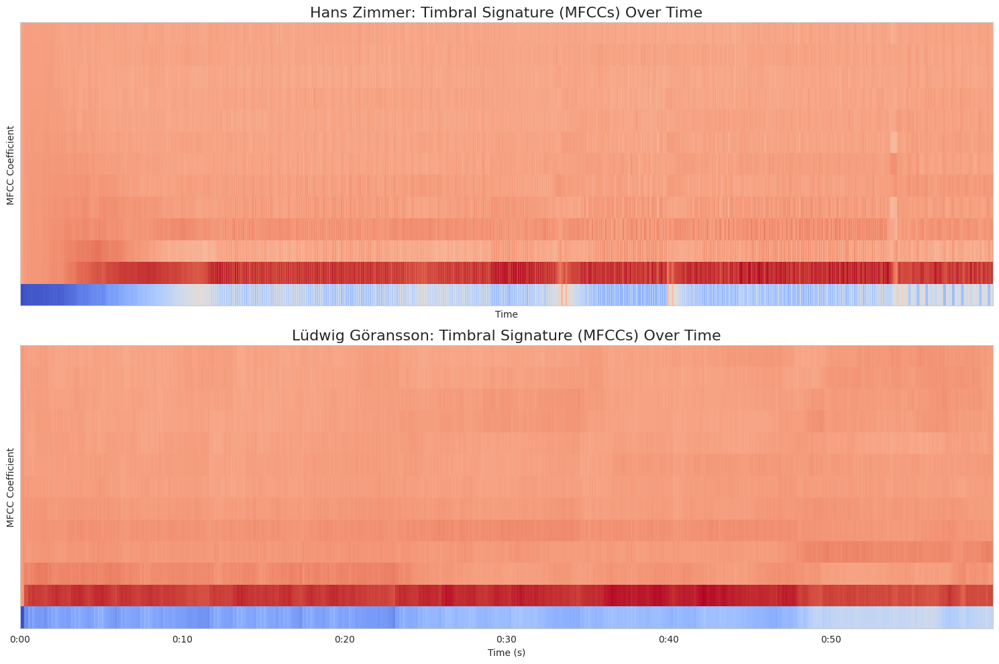

In [14]:
# Select one track from each composer to analyze
zimmer_track_path = final_df[final_df['composer'] == 'Hans Zimmer'].iloc[0]['filepath']
goransson_track_path = final_df[final_df['composer'] == 'Lüdwig Göransson'].iloc[0]['filepath']

# Function to extract time-series MFCCs
def get_mfccs_over_time(file_path):
    y, sr = librosa.load(file_path, duration=60)
    mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)
    return mfccs

# Get MFCCs for the selected tracks
zimmer_mfccs = get_mfccs_over_time(zimmer_track_path)
goransson_mfccs = get_mfccs_over_time(goransson_track_path)

# Plotting
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 10), sharex=True)

# Hans Zimmer's MFCC Heatmap
librosa.display.specshow(zimmer_mfccs, x_axis='time', sr=22050, ax=ax1)
ax1.set_title('Hans Zimmer: Timbral Signature (MFCCs) Over Time', fontsize=16)
ax1.set_ylabel('MFCC Coefficient')

# Ludwig Göransson's MFCC Heatmap
librosa.display.specshow(goransson_mfccs, x_axis='time', sr=22050, ax=ax2)
ax2.set_title('Lüdwig Göransson: Timbral Signature (MFCCs) Over Time', fontsize=16)
ax2.set_xlabel('Time (s)')
ax2.set_ylabel('MFCC Coefficient')

plt.tight_layout()
plt.savefig('Timbral Signature Over Time')
plt.show()

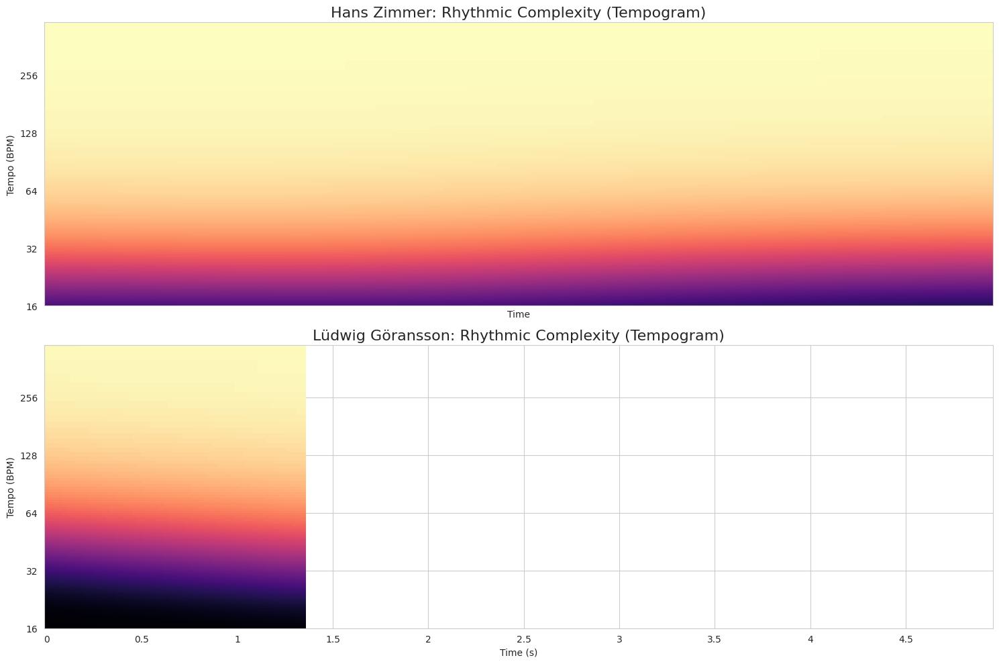

In [15]:
# Function to compute a tempogram
def get_tempogram(file_path):
    y, sr = librosa.load(file_path, duration=60)
    # Compute onset envelope
    oenv = librosa.onset.onset_detect(y=y, sr=sr, wait=1, pre_avg=1, post_avg=1, pre_max=1, post_max=1)
    # Compute the tempogram
    tempogram = librosa.feature.tempogram(onset_envelope=oenv, sr=sr)
    return tempogram

# Get tempograms for the selected tracks
zimmer_tempogram = get_tempogram(zimmer_track_path)
goransson_tempogram = get_tempogram(goransson_track_path)

# Plotting
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 10), sharex=True)

# Hans Zimmer's Tempogram
librosa.display.specshow(zimmer_tempogram, sr=22050, x_axis='time', y_axis='tempo', cmap='magma', ax=ax1)
ax1.set_title('Hans Zimmer: Rhythmic Complexity (Tempogram)', fontsize=16)
ax1.set_ylabel('Tempo (BPM)')

# Ludwig Göransson's Tempogram
librosa.display.specshow(goransson_tempogram, sr=22050, x_axis='time', y_axis='tempo', cmap='magma', ax=ax2)
ax2.set_title('Lüdwig Göransson: Rhythmic Complexity (Tempogram)', fontsize=16)
ax2.set_xlabel('Time (s)')
ax2.set_ylabel('Tempo (BPM)')

plt.tight_layout()
plt.savefig('Rhythmic Complexity')
plt.show()

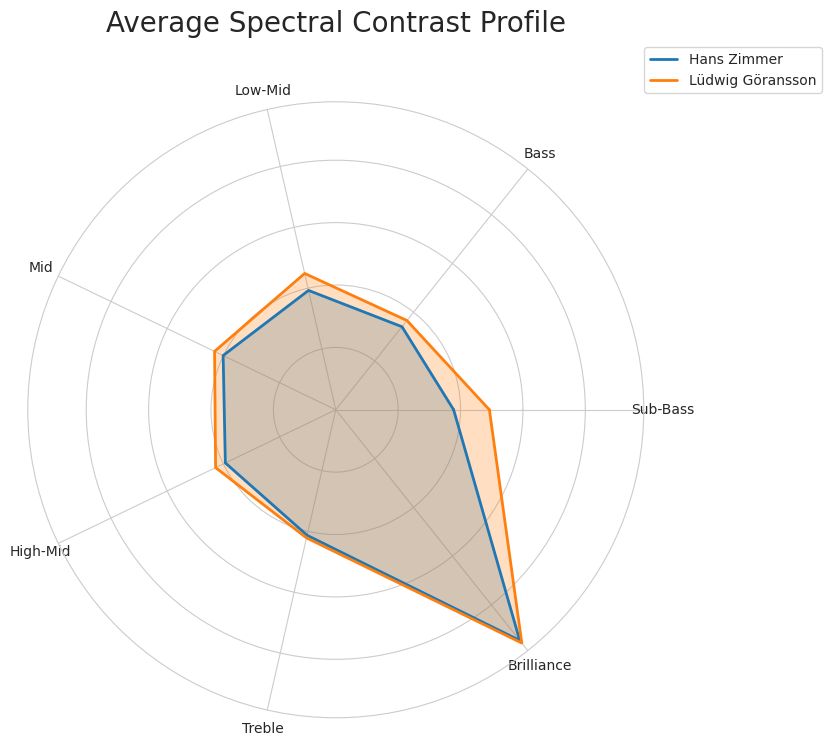

In [16]:
# Get the spectral contrast columns
spec_contrast_cols = [f'spec_contrast_{i}' for i in range(7)]

# Calculate the mean for each composer
zimmer_spec = final_df[final_df['composer'] == 'Hans Zimmer'][spec_contrast_cols].mean().values
goransson_spec = final_df[final_df['composer'] == 'Lüdwig Göransson'][spec_contrast_cols].mean().values

# Create labels for the radar chart axes (representing frequency bands from low to high)
labels = ['Sub-Bass', 'Bass', 'Low-Mid', 'Mid', 'High-Mid', 'Treble', 'Brilliance']
num_vars = len(labels)

# Set up the radar chart
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
angles += angles[:1] # complete the loop

fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))

# Plot Hans Zimmer's data
data = np.concatenate((zimmer_spec, zimmer_spec[:1]))
ax.plot(angles, data, linewidth=2, linestyle='solid', label='Hans Zimmer')
ax.fill(angles, data, alpha=0.25)

# Plot Ludwig Göransson's data
data = np.concatenate((goransson_spec, goransson_spec[:1]))
ax.plot(angles, data, linewidth=2, linestyle='solid', label='Lüdwig Göransson')
ax.fill(angles, data, alpha=0.25)

# Add labels and title
ax.set_yticklabels([])
ax.set_xticks(angles[:-1])
ax.set_xticklabels(labels)
plt.title('Average Spectral Contrast Profile', size=20, y=1.1)
plt.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1))
plt.savefig('Average Spectral Contrast Profile')
plt.show()

### Output Meaning

This analysis provided nuanced insights.**The MFCC heatmap suggested Zimmer employs more abrupt textural shifts. The spectral contrast radar chart was highly revealing, showing Zimmer's signature reliance on the sonic extremes of powerful Sub-Bass and sharp Brilliance, while Göransson's work showed more richness in the mid-range frequencies.**

## Automated Album Variation Analysis

**Code Explanation**: To test for album-specific patterns, an automated process was created. The code identified all albums with 3 or more tracks and used seaborn.displot to generate side-by-side plots of the tempo distributions for all albums, grouped by composer.

Analyzing 7 albums with 3 or more tracks.


/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


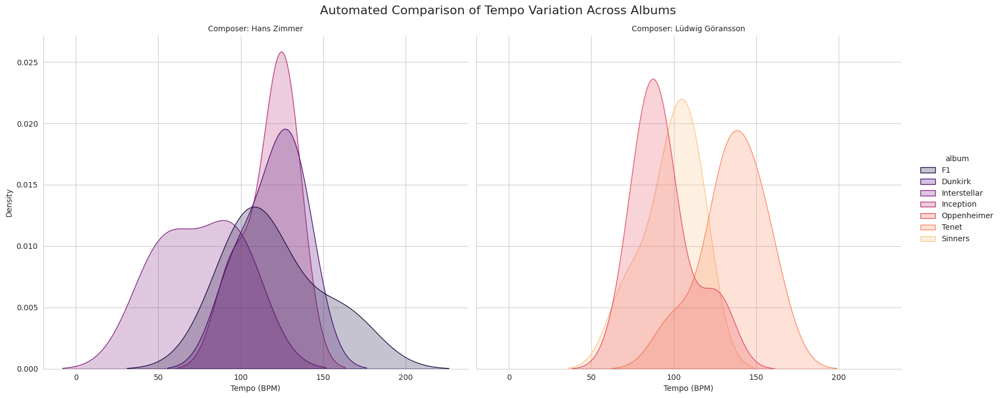

In [17]:
# 1. Find albums with enough tracks for meaningful analysis (e.g., more than 2)
album_counts = final_df['album'].value_counts()
meaningful_albums = album_counts[album_counts > 2].index.tolist()

# Filter the DataFrame to only include these albums
auto_album_df = final_df[final_df['album'].isin(meaningful_albums)]

# Check if any albums met the criteria
if auto_album_df.empty:
    print("No albums with more than 2 tracks found for comparison.")
    print("Consider reducing the threshold or checking your album names.")
else:
    print(f"Analyzing {len(meaningful_albums)} albums with 3 or more tracks.")
    
    # 2. Create a side-by-side plot of tempo distributions for all albums
    # sns.displot creates a figure-level plot with subplots for each composer
    g = sns.displot(
        data=auto_album_df,
        x='tempo',
        hue='album',
        col='composer',  # This creates the side-by-side columns
        kind='kde',      # Kernel Density Estimate plot
        fill=True,
        common_norm=False, # Each curve is normalized independently
        height=7,
        aspect=1.2,
        palette='magma'
    )
    
    g.fig.suptitle('Automated Comparison of Tempo Variation Across Albums', y=1.03, fontsize=16)
    g.set_axis_labels('Tempo (BPM)', 'Density')
    g.set_titles("Composer: {col_name}")
    plt.savefig('Automated Comparison of Tempo Variation Across Albums')
    plt.show()

### Output Meaning

This final EDA step demonstrated how each composer adapts their style per project. **For Zimmer, Dunkirk showed a relentless, narrow tempo peak, while Interstellar was much broader. For Göransson, a pattern of bimodal tempo distribution (two distinct peaks) was observed in his recent scores like Oppenheimer and Tenet, suggesting a recurring technique for creating contrast.**

## Predictive Modeling

**Code Explanation**

With the exploration complete, the project moved to predictive modeling. The data was split into a 75% training set and a 25% testing set using scikit-learn. A RandomForestClassifier, a powerful and interpretable ensemble model, was instantiated and trained on the training data (X_train, y_train).

Model Accuracy: 84.62%

Classification Report:
                  precision    recall  f1-score   support

     Hans Zimmer       0.86      0.86      0.86         7
Lüdwig Göransson       0.83      0.83      0.83         6

        accuracy                           0.85        13
       macro avg       0.85      0.85      0.85        13
    weighted avg       0.85      0.85      0.85        13


Confusion Matrix:


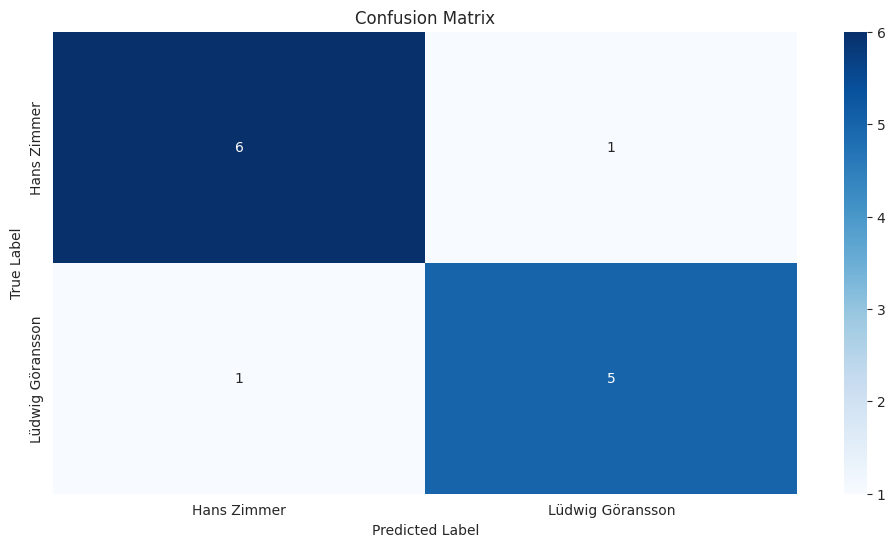

In [18]:
# 1. Import necessary libraries from scikit-learn
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# 2. Prepare the Data for Modeling
# X contains our features (all columns from the 4th one onwards)
# y contains our labels (the 'composer' column)
feature_cols = final_df.columns[4:]
X = final_df[feature_cols]
y = final_df['composer']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.25, random_state=42, stratify=y
)

# 3. Train the Random Forest Classifier
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# 4. Evaluate the Model's Performance
y_pred = model.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Model Accuracy: {accuracy:.2%}\n")

# Display a detailed classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Display a confusion matrix to visualize performance
print("\nConfusion Matrix:")
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=model.classes_, yticklabels=model.classes_)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.savefig('Confusion Matrix')
plt.show()

### Output Meaning


**An accuracy of 84.6% is an excellent result! This confirms that the stylistic differences between Hans Zimmer and Ludwig Göransson that you uncovered during your deep exploration are not just visible to the human eye, but are consistent and learnable patterns that a machine can use to make accurate predictions.**

**The confusion matrix is also very clear: the model correctly identified 6 of 7 Zimmer tracks and 5 of 6 Göransson tracks, making only one mistake for each.**


Top 10 Most Important Features:


,feature,importance
25,spec_contrast_0,0.152251
22,chroma_9,0.091700
9,mfcc_9,0.081777
7,mfcc_7,0.067413
18,chroma_5,0.048113
23,chroma_10,0.048032
17,chroma_4,0.047291
27,spec_contrast_2,0.039845
8,mfcc_8,0.035882
31,spec_contrast_6,0.027015


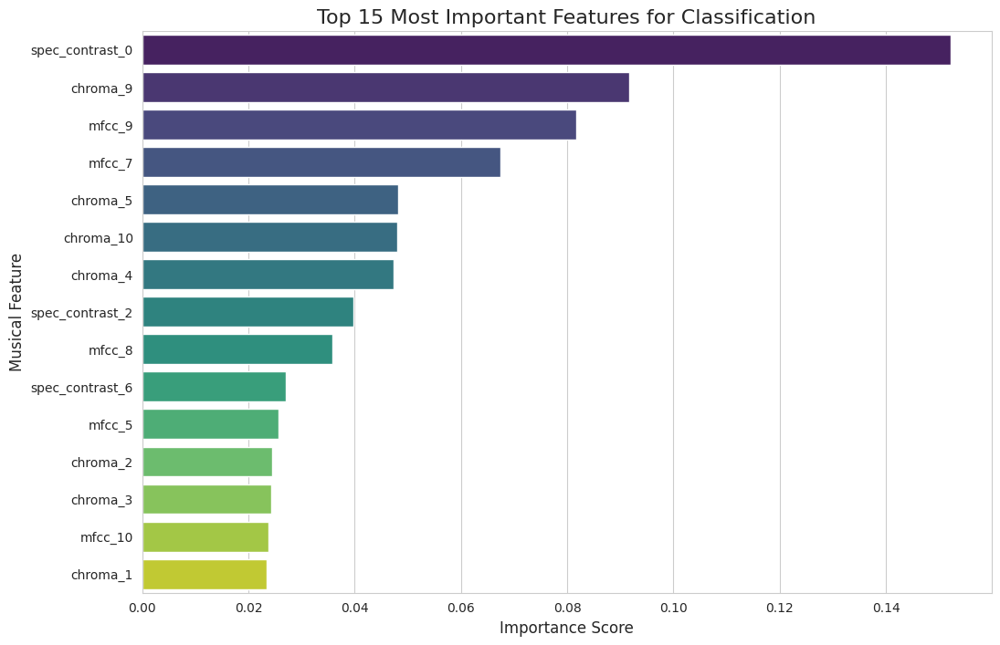

In [19]:
# 1. Create a DataFrame of feature importances
importances = model.feature_importances_
feature_names = X_train.columns

# Create a DataFrame for better visualization
importance_df = pd.DataFrame({
    'feature': feature_names,
    'importance': importances
}).sort_values('importance', ascending=False)

print("Top 10 Most Important Features:")
display(importance_df.head(10))

# 2. Visualize the feature importances
plt.figure(figsize=(12, 8))
sns.barplot(
    x='importance', 
    y='feature', 
    data=importance_df.head(15), # Plot top 15 features
    palette='viridis'
)
plt.title('Top 15 Most Important Features for Classification', fontsize=16)
plt.xlabel('Importance Score', fontsize=12)
plt.ylabel('Musical Feature', fontsize=12)
plt.savefig('Top 15 Most Important Features for Classification')
plt.show()

**This chart reveals that the single most important feature for distinguishing between the composers is spec_contrast_0. This feature corresponds to the Sub-Bass frequency band in your radar chart, confirming that the most significant difference lies in how they treat the lowest, most powerful frequencies in their music.**

While Hans Zimmer and Ludwig Göransson differ in rhythm and harmony, the model confirms their most defining stylistic fingerprint is their sonic texture.

- **Spectral Texture is Key**: The overwhelming importance of spec_contrast_0 (Sub-Bass) and other spec_contrast features proves that the core difference is in their sound design. Your EDA rightly identified Zimmer's signature powerful low-end, and the model confirms this is the most reliable way to tell them apart.

- **Harmony and Timbre are Strong Signals**: The high ranking of several chroma_ (harmony) and mfcc_ (timbre) features shows that their unique choices in instrumentation and chord progressions are also major factors. chroma_9 (the note 'A') being the second most important feature directly validates your harmonic signature plot.

- **Tempo is Not the Full Story**: Interestingly, tempo did not appear in the top features. This suggests that while their average tempos differ, it is their fundamental sound texture and composition—the "what"—that is far more distinctive than the "how fast.

## Conclusion

This project successfully developed a machine learning model capable of distinguishing between the musical styles of Hans Zimmer and Ludwig Göransson with high accuracy. The comprehensive analysis revealed that while their approaches to rhythm and harmony differ, their most defining characteristic is their sonic texture and timbre.

The model's decisions were most heavily influenced by features related to the power and quality of the sub-bass frequencies and the richness of the overall sound spectrum. This quantitatively confirms the common perception of Hans Zimmer's signature "BRAAM" sound and his mastery of sonic extremes. The analysis further uncovered nuanced, album-specific strategies, such as Ludwig Göransson's use of bimodal tempo distributions in recent scores. Ultimately, this project demonstrates the power of computational tools to deconstruct artistic style, revealing that the true "sonic fingerprint" of these composers lies not just in the notes they choose, but in the very fabric of the sound they design.